In [1]:
import torch

## Reading data from edf files

In [2]:
import pyedflib
import numpy as np

def read_edf_signals(edf_file):
    f = pyedflib.EdfReader(edf_file)
    num_signals = f.signals_in_file


    signals = []
    for i in range(num_signals):
        signal = f.readSignal(i)
        signals.append(signal)

    labels = f.getSignalLabels()
    sampling_rates = f.getSampleFrequencies()

    f.close()
    
    return signals, labels, sampling_rates

edf_file_path = "./dataset/files/ucddb002.rec"
signals, labels, sampling_rates = read_edf_signals(edf_file_path)

print("Signal labels:", labels)
print("Sampling rates:", sampling_rates)

print("First 10 samples of the first signal:", signals[0][:10]) 

# Imp signals -> 'Flow', 'ribcage'


Signal labels: ['Lefteye', 'RightEye', 'EMG', 'C3A2', 'C4A1', 'ECG', 'SpO2', 'Sound', 'Flow', 'Sum', 'ribcage', 'abdo', 'BodyPos', 'Pulse']
Sampling rates: [ 64.  64.  64. 128. 128. 128.   8.   8.   8.   8.   8.   8.   8.   8.]
First 10 samples of the first signal: [0.55873016 0.64664225 0.74432234 0.84981685 1.03150183 1.11159951
 1.14090354 0.98852259 0.88107448 0.81074481]


In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [4]:
x_list = []
y_list = []

In [5]:
sleep_stages = np.loadtxt(f"dataset/files/ucddb002_stage.txt", dtype=int)
sleep_stages

wake_awake = (sleep_stages > 0).astype(int)
wake_awake

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [6]:
from darts import TimeSeries
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [7]:
times = pd.Index(np.arange(0, len(sleep_stages) * 30, 30))
time_signal = TimeSeries.from_times_and_values(times, sleep_stages)

wake_awake_signal = TimeSeries.from_times_and_values(times, wake_awake)

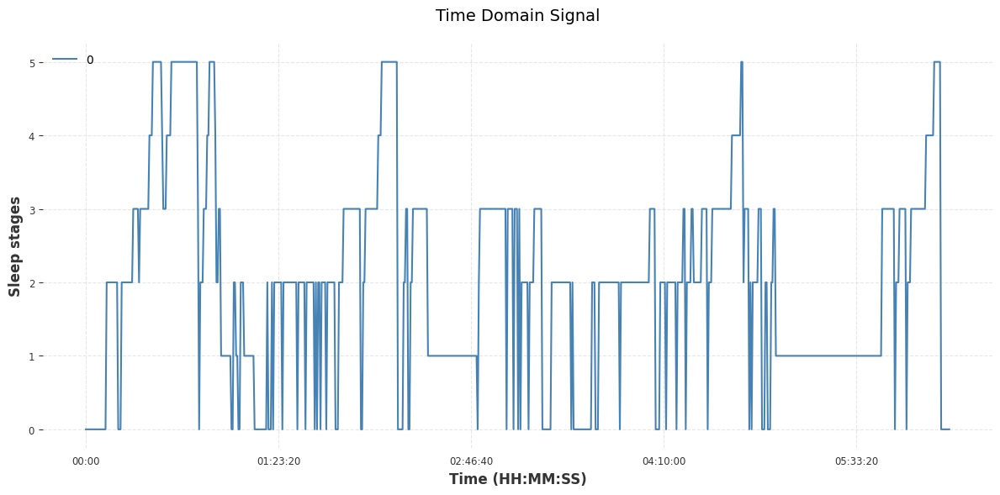

In [8]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 6))

time_signal.plot(ax=ax, color='steelblue', linewidth=1.5)

def format_time(x, pos):
    hours = int(x // 3600)
    minutes = int((x % 3600) // 60)
    seconds = int(x % 60)
    return f"{hours:02d}:{minutes:02d}:{seconds:02d}" if hours > 0 else f"{minutes:02d}:{seconds:02d}"

ax.xaxis.set_major_formatter(plt.FuncFormatter(format_time))

ax.set_xlabel('Time (HH:MM:SS)', fontsize=12)
ax.set_ylabel('Sleep stages', fontsize=12)
ax.set_title('Time Domain Signal', fontsize=14, pad=20)

ax.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

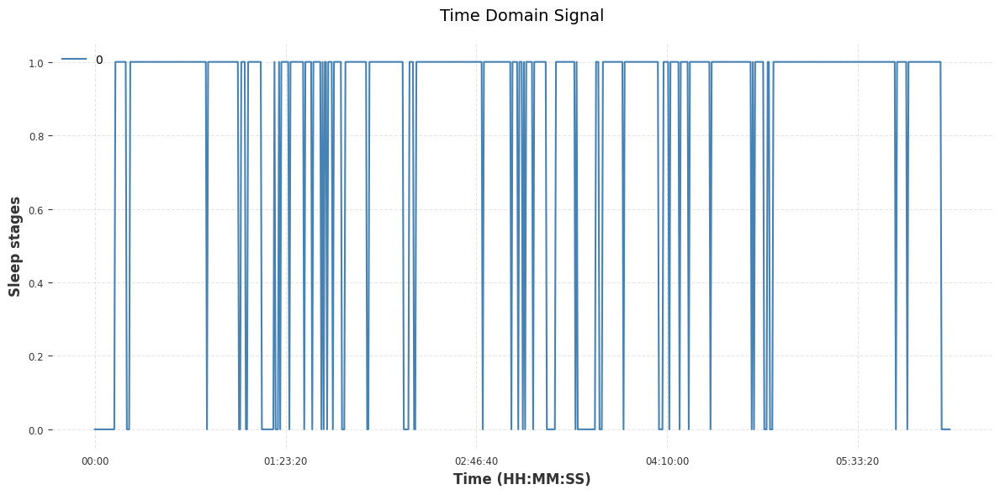

In [9]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 6))

wake_awake_signal.plot(ax=ax, color='steelblue', linewidth=1.5)

def format_time(x, pos):
    hours = int(x // 3600)
    minutes = int((x % 3600) // 60)
    seconds = int(x % 60)
    return f"{hours:02d}:{minutes:02d}:{seconds:02d}" if hours > 0 else f"{minutes:02d}:{seconds:02d}"

ax.xaxis.set_major_formatter(plt.FuncFormatter(format_time))

ax.set_xlabel('Time (HH:MM:SS)', fontsize=12)
ax.set_ylabel('Sleep stages', fontsize=12)
ax.set_title('Time Domain Signal', fontsize=14, pad=20)

ax.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [10]:
x_list = []
y_list = []

for i in range(2, 29):
    try:
        if i<10:
            sleep_stages = np.loadtxt(f"dataset/files/ucddb00{i}_stage.txt", dtype=int)
            edf_file_path = f"./dataset/files/ucddb00{i}.rec"
            signals, labels, sampling_rates = read_edf_signals(edf_file_path)
        else:
            sleep_stages = np.loadtxt(f"dataset/files/ucddb0{i}_stage.txt", dtype=int)
            edf_file_path = f"./dataset/files/ucddb0{i}.rec"
            signals, labels, sampling_rates = read_edf_signals(edf_file_path)

        x_list.append([signals[8], signals[10]])
        y_list.append(sleep_stages)
    except:
        print(f"Error in file {i}")
        continue

    print()
    print()
    print(f"File {i} has {len(signals)} signals", \
          "\nsamples [nasal, ribcage]", f"[{len(signals[8])}, {len(signals[10])}]", \
          "\nsampling rate [nasal, ribcage]", f"[{sampling_rates[8]}, {sampling_rates[10]}]",\
          "\nno of sleep stages", len(signals[8])/(30*sampling_rates[8]), len(signals[10])/(30*sampling_rates[10]),  \
          "\nSleep stages: ", len(sleep_stages))    



File 2 has 14 signals 
samples [nasal, ribcage] [179760, 179760] 
sampling rate [nasal, ribcage] [8.0, 8.0] 
no of sleep stages 749.0 749.0 
Sleep stages:  748


File 3 has 14 signals 
samples [nasal, ribcage] [211824, 211824] 
sampling rate [nasal, ribcage] [8.0, 8.0] 
no of sleep stages 882.6 882.6 
Sleep stages:  882
Error in file 4


File 5 has 14 signals 
samples [nasal, ribcage] [198384, 198384] 
sampling rate [nasal, ribcage] [8.0, 8.0] 
no of sleep stages 826.6 826.6 
Sleep stages:  826


File 6 has 14 signals 
samples [nasal, ribcage] [194136, 194136] 
sampling rate [nasal, ribcage] [8.0, 8.0] 
no of sleep stages 808.9 808.9 
Sleep stages:  808


File 7 has 14 signals 
samples [nasal, ribcage] [195240, 195240] 
sampling rate [nasal, ribcage] [8.0, 8.0] 
no of sleep stages 813.5 813.5 
Sleep stages:  813


File 8 has 14 signals 
samples [nasal, ribcage] [184328, 184328] 
sampling rate [nasal, ribcage] [8.0, 8.0] 
no of sleep stages 768.0333333333333 768.0333333333333 
Sleep s

In [11]:
print(len(x_list), len(y_list))

25 25


(subject, segment no, 2, 240)

## Processing data

In [12]:
reshaped_x_list = []
for i in range(len(x_list)):
    array1 = np.array(x_list[i][0])
    array2 = np.array(x_list[i][1])

    truncated_array1 = array1[:len(y_list[i])*240]
    truncated_array2 = array2[:len(y_list[i])*240]

    reshaped1 = truncated_array1.reshape(-1, 240) 
    reshaped2 = truncated_array2.reshape(-1, 240) 

    final_array = np.stack([reshaped1, reshaped2], axis=1)
    reshaped_x_list.append(final_array)

    print(array1.shape, array2.shape, y_list[i].shape, final_array.shape)

print(len(reshaped_x_list))

(179760,) (179760,) (748,) (748, 2, 240)
(211824,) (211824,) (882,) (882, 2, 240)
(198384,) (198384,) (826,) (826, 2, 240)
(194136,) (194136,) (808,) (808, 2, 240)
(195240,) (195240,) (813,) (813, 2, 240)
(184328,) (184328,) (768,) (768, 2, 240)
(222072,) (222072,) (925,) (925, 2, 240)
(217688,) (217688,) (907,) (907, 2, 240)
(216240,) (216240,) (900,) (900, 2, 240)
(207528,) (207528,) (864,) (864, 2, 240)
(194664,) (194664,) (811,) (811, 2, 240)
(185912,) (185912,) (774,) (774, 2, 240)
(219904,) (219904,) (916,) (916, 2, 240)
(189472,) (189472,) (789,) (789, 2, 240)
(197480,) (197480,) (822,) (822, 2, 240)
(204584,) (204584,) (852,) (852, 2, 240)
(180688,) (180688,) (752,) (752, 2, 240)
(219272,) (219272,) (913,) (913, 2, 240)
(189120,) (189120,) (787,) (787, 2, 240)
(206800,) (206800,) (861,) (861, 2, 240)
(218000,) (218000,) (908,) (908, 2, 240)
(170800,) (170800,) (711,) (711, 2, 240)
(201280,) (201280,) (838,) (838, 2, 240)
(214328,) (214328,) (893,) (893, 2, 240)
(173280,) (17328

In [13]:
for i in range(len(y_list)):
    y_list[i] = y_list[i].reshape(-1, 1)

In [14]:
X_all = np.concatenate(reshaped_x_list, axis=0)
y_all = np.concatenate(y_list, axis=0)           

X_all.shape, y_all.shape

((20789, 2, 240), (20789, 1))

## Converting to Pandas dataframe

In [15]:
df = pd.DataFrame({
    'nasal': [X_all[i, 0, :] for i in range(X_all.shape[0])],   
    'ribcage': [X_all[i, 1, :] for i in range(X_all.shape[0])],
    'sleep stage': y_all.flatten()
})

In [16]:
df[:20]

,nasal,ribcage,sleep stage
0,"[-19.065934065934066, -18.772893772893774, -18...","[-3.27008547008547, -3.10989010989011, -2.9106...",0
1,"[11.0, 4.221001221001221, -1.4444444444444444,...","[-0.242002442002442, -0.7772893772893773, -1.2...",0
2,"[13.617826617826617, 8.831501831501832, 5.1001...","[0.23467643467643468, 0.5824175824175825, 2.59...",0
3,"[-5.214896214896215, 0.43101343101343104, 5.13...","[-1.4766788766788768, -0.7811965811965812, 0.2...",0
4,"[-0.3894993894993895, -7.3638583638583635, -13...","[0.9926739926739927, 0.023687423687423687, -0....",0
5,"[14.633699633699633, 8.616605616605616, -2.675...","[2.872039072039072, 2.246886446886447, 1.53577...",0
6,"[-2.304029304029304, -1.6398046398046398, -0.9...","[-2.809035409035409, -2.3597069597069598, -1.9...",0
7,"[-4.492063492063492, -6.758241758241758, -8.14...","[0.6644688644688644, 0.2385836385836386, -0.48...",0
8,"[7.581196581196581, 7.9914529914529915, 8.2844...","[1.613919413919414, 1.8053724053724054, 1.9186...",0
9,"[-2.8705738705738706, -5.507936507936508, -7.5...","[0.09010989010989011, -0.15995115995115994, -0...",0


In [17]:
import pandas as pd
import numpy as np

flattened_data = []

for series_id, row in df.iterrows():
    nasal_series = row['nasal']
    ribcage_series = row['ribcage']
    sleep_stage = row['sleep stage']
    
    sample_points = np.arange(len(nasal_series))
    
    for s in sample_points:
        flattened_data.append({
            'series_id': series_id,
            'sample_point': s,
            'nasal': nasal_series[s],
            'ribcage': ribcage_series[s],
            'sleep_stage': sleep_stage
        })

flat_df = pd.DataFrame(flattened_data)

flat_df = flat_df[['series_id', 'sample_point', 'nasal', 'ribcage', 'sleep_stage']]

In [18]:
flat_df.shape

(4989360, 5)

In [19]:
flat_df[:10]

,series_id,sample_point,nasal,ribcage,sleep_stage
0,0,0,-19.065934,-3.270085,0
1,0,1,-18.772894,-3.109890,0
2,0,2,-18.225885,-2.910623,0
3,0,3,-16.995116,-2.734799,0
4,0,4,-15.334554,-2.492552,0
5,0,5,-12.814408,-2.121368,0
6,0,6,-7.461538,-1.453236,0
7,0,7,4.299145,-0.441270,0
8,0,8,12.777778,0.437851,0
9,0,9,17.407814,1.094261,0


In [20]:
counts = flat_df['sleep_stage'].value_counts()
counts /= 240
counts

sleep_stage
3    6985.0
0    4707.0
2    3403.0
1    3016.0
5    1990.0
4     673.0
8      15.0
Name: count, dtype: float64

## Distribution of sleep stages

<Axes: xlabel='sleep_stage'>

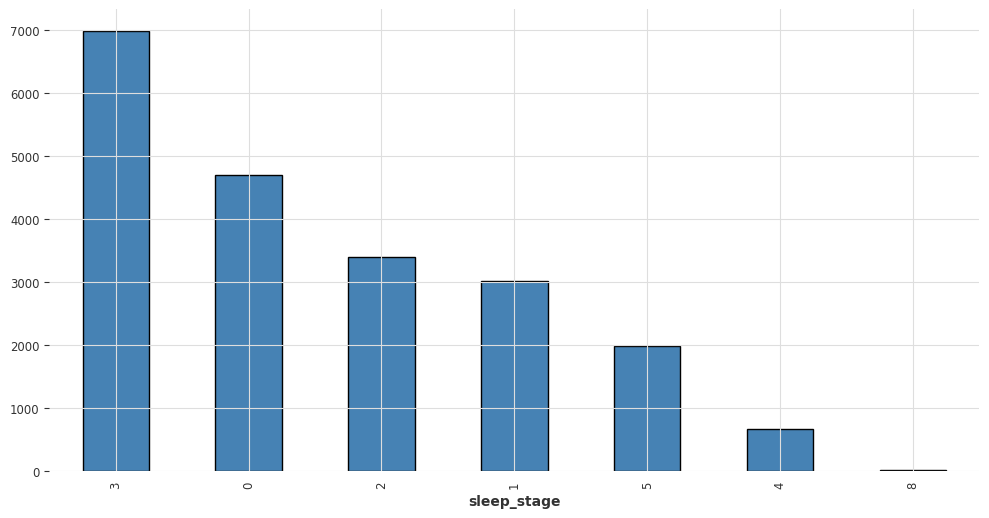

In [21]:
counts.plot(kind='bar', figsize=(12, 6), color='steelblue', edgecolor='black')

In [22]:
flat_df['sleep_stage_binary'] = (flat_df['sleep_stage'] > 0).astype(int)

In [23]:
counts_binary = flat_df['sleep_stage_binary'].value_counts()
counts_binary /= 240
counts_binary

sleep_stage_binary
1    16082.0
0     4707.0
Name: count, dtype: float64

## Distribution of Binary Sleep stages

<Axes: xlabel='sleep_stage_binary'>

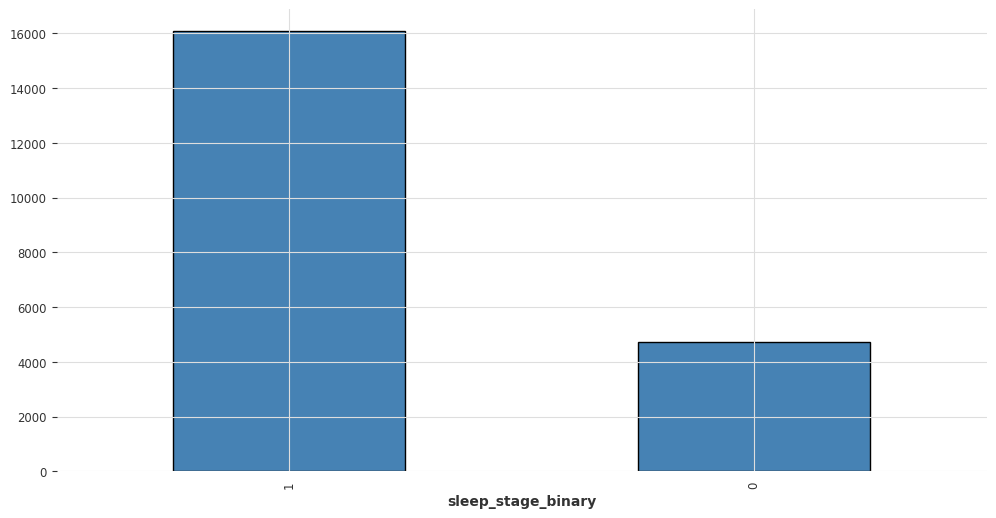

In [24]:
counts_binary.plot(kind='bar', figsize=(12, 6), color='steelblue', edgecolor='black')

In [25]:
y_binary = (y_all > 0).astype(int)
np.unique(y_binary, return_counts=True)

(array([0, 1]), array([ 4707, 16082], dtype=int64))

In [26]:
data_seq_binary = []

for i in range(0, X_all.shape[0]):
    data_seq_binary.append([X_all[i], y_binary[i]])

In [27]:
type(data_seq_binary[0][1])

numpy.ndarray

## Creating Pytorch Dataset

In [28]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
device = get_default_device()
device

device(type='cuda')

In [29]:
# from torch.utils.data import Dataset

# class SleepDataset(Dataset):
#     def __init__(self, data_seq):
#         self.data_seq = data_seq

#     def __len__(self):
#         return len(self.data_seq)
    
#     def __getitem__(self, idx):
#         seq, label = self.data_seq[idx]
#         return dict(
#             seq=torch.tensor(seq, dtype=torch.float32, device=device),
#             label=torch.tensor(label, device=device).long()
#         )

In [30]:
# dataset[0]["seq"].shape, dataset[0]["label"].shape

In [31]:
from sklearn.model_selection import train_test_split
train_seq, test_seq = train_test_split(data_seq_binary, test_size=0.2, random_state=42)

In [32]:
train_seq

[[array([[ 5.45177045e+00,  5.06105006e+00,  4.70940171e+00,
           4.31868132e+00,  3.86935287e+00,  3.38095238e+00,
           2.79487179e+00,  1.56410256e+00, -4.87179487e-01,
          -3.53479853e+00, -6.21123321e+00, -7.59829060e+00,
          -7.73504274e+00, -7.94993895e+00, -7.89133089e+00,
          -7.01221001e+00, -5.76190476e+00, -5.00000000e+00,
          -4.21855922e+00, -3.51526252e+00, -3.41758242e+00,
          -3.51526252e+00, -3.22222222e+00, -2.71428571e+00,
          -2.28449328e+00, -1.93284493e+00, -1.46398046e+00,
          -1.03418803e+00, -7.60683761e-01,  7.93650794e-02,
           2.48229548e+00,  4.76800977e+00,  6.11599512e+00,
           6.64346764e+00,  6.72161172e+00,  6.68253968e+00,
           6.48717949e+00,  6.19413919e+00,  5.84249084e+00,
           5.47130647e+00,  5.04151404e+00,  4.53357753e+00,
           4.06471306e+00,  3.57631258e+00,  2.71672772e+00,
           8.60805861e-01, -1.44444444e+00, -3.43711844e+00,
          -4.98046398e+0

In [33]:
train_seq_tensorX = torch.tensor([seq for seq, label in train_seq], dtype=torch.float32, device=device)
train_seq_tensorY = torch.tensor([label for seq, label in train_seq], dtype=torch.float32, device=device)

test_seq_tensorX = torch.tensor([seq for seq, label in test_seq], dtype=torch.float32, device=device)
test_seq_tensorY = torch.tensor([label for seq, label in test_seq], dtype=torch.float32, device=device)

C:\Users\tanis\AppData\Local\Temp\ipykernel_43972\3716956531.py:1: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:281.)
  train_seq_tensorX = torch.tensor([seq for seq, label in train_seq], dtype=torch.float32, device=device)


In [34]:
train_seq_tensorX.shape, train_seq_tensorY.shape, test_seq_tensorX.shape, test_seq_tensorY.shape

(torch.Size([16631, 2, 240]),
 torch.Size([16631, 1]),
 torch.Size([4158, 2, 240]),
 torch.Size([4158, 1]))

In [35]:
# from torch.utils.data import random_split

# train_size = int(0.8 * len(dataset))
# val_size = len(dataset) - train_size    

# train_ds, val_ds = random_split(dataset, [train_size, val_size])

In [36]:
# creat dataset
from torch.utils.data import TensorDataset

train_dataset = TensorDataset(train_seq_tensorX, train_seq_tensorY)
test_dataset = TensorDataset(test_seq_tensorX, test_seq_tensorY)

In [37]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4)

In [38]:
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [39]:
len(train_dataloader)

1040

In [40]:
for batch in train_dataloader:
    print(batch[0].shape)
    batch[0] = to_device(batch[0], device)
    print(batch[0].device)
    break

torch.Size([16, 2, 240])
cuda:0


In [41]:
N_EPOCHS = 250
LEARNING_RATE = 0.001
BATCH_SIZE = 64

In [42]:
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [43]:
train_loader = DeviceDataLoader(train_dataloader, device)
test_loader = DeviceDataLoader(test_dataloader, device)

In [44]:
device

device(type='cuda')

In [45]:
# for xb, yb in test_dataloader:
#     print('xb.device:', xb.device)
#     print('yb:', yb)
#     break

## MODEL

In [46]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [47]:
import torch.nn.functional as F
import torch.nn as nn

%matplotlib inline

In [70]:
class SleepClassify(nn.Module):
    def __init__(self, n_features, n_classes, n_hidden_size=256, n_layers=3):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size=n_features,  # Should match your actual feature dimension (2)
            hidden_size=n_hidden_size,
            num_layers=n_layers,
            batch_first=True,
            dropout=0.5
        )
        self.classifier = nn.Linear(n_hidden_size, n_classes)

    def forward(self, x):
        x = x.permute(0, 2, 1)  # New shape: (16, 240, 2)
        
        _, (hidden, _) = self.lstm(x)
        out = hidden[-1]  # Take the last hidden state
        return self.classifier(out)

In [71]:
model = SleepClassify(n_features=2, n_classes=2).to(device)

In [72]:
## training loop
from torch.optim import AdamW
criteria = nn.CrossEntropyLoss()
optimizer = AdamW(model.parameters(), lr=LEARNING_RATE)

In [73]:
train_losses = []
test_losses = []

In [74]:
def train(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    model.train()
    for batch, (X, y) in enumerate(dataloader):
        # Compute prediction error
        y = y.squeeze().long()  # Critical fix
        pred = model(X)
        loss = loss_fn(pred, y)
        print(f"loss: {loss:>7f}")

        # Backpropagation
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        # to check batch wise loss
        train_losses.append(loss.item())

        if batch % 100 == 0:
            loss, current = loss.item(), (batch + 1) * len(X)
            print(f"loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")

In [75]:
def test(dataloader, model, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    test_loss, correct = 0, 0
    with torch.no_grad():
        for X, y in dataloader:
            y = y.squeeze().long()
            pred = model(X)
            curr_loss = loss_fn(pred, y).item()
            test_loss += curr_loss
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()
            test_losses.append(curr_loss)
    test_loss /= num_batches
    correct /= size
    print(f"Test Error: \n Accuracy: {(100*correct):>0.1f}%, Avg loss: {test_loss:>8f} \n")

In [76]:
epochs = 2
for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    train(train_dataloader, model, criteria, optimizer)
    test(test_dataloader, model, criteria)
print("Done!")

Epoch 1
-------------------------------
loss: 0.673717
loss: 0.673717  [   16/16631]
loss: 0.620498
loss: 0.563547
loss: 0.484333
loss: 0.355624
loss: 0.146684
loss: 0.011307
loss: 0.001562
loss: 0.000472
loss: 0.000227
loss: 0.000119
loss: 0.000072
loss: 0.000046
loss: 0.000032
loss: 0.000023
loss: 0.000018
loss: 0.000014
loss: 0.000011
loss: 0.000009
loss: 0.000008
loss: 0.000007
loss: 0.000006
loss: 0.000005
loss: 0.000005
loss: 0.000004
loss: 0.000004
loss: 0.000004
loss: 0.000003
loss: 0.000003
loss: 0.000003
loss: 0.000003
loss: 0.000003
loss: 0.000003
loss: 0.000003
loss: 0.000003
loss: 0.000003
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002
loss: 0.000002


In [77]:
torch.save(model.state_dict(), "model1.pth")
print("Saved PyTorch Model State to model1.pth")

Saved PyTorch Model State to model1.pth


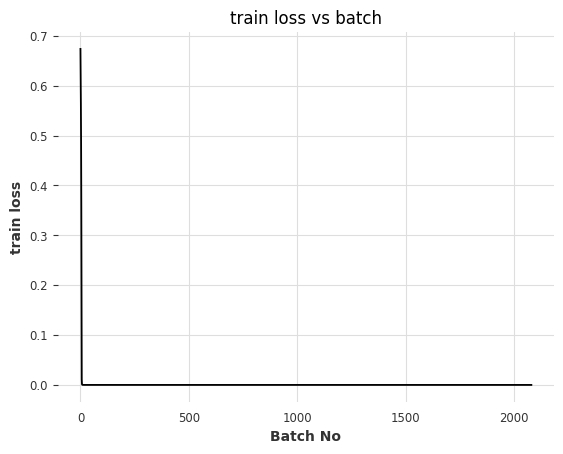

In [78]:
fig, ax = plt.subplots()  

ax.plot(train_losses)

ax.set_title('train loss vs batch')
ax.set_xlabel('Batch No')
ax.set_ylabel('train loss')

ax.grid(True)

plt.show()

In [80]:
new_test_loss = []
for batch, i in enumerate(test_losses):
    new_test_loss.append(i/(batch+1))

In [81]:
new_test_loss

[9.536740890325746e-07,
 4.768370445162873e-07,
 3.178913630108582e-07,
 2.3841852225814364e-07,
 1.907348178065149e-07,
 1.589456815054291e-07,
 1.3623915557608208e-07,
 1.1920926112907182e-07,
 1.0596378767028607e-07,
 9.536740890325745e-08,
 8.669764445750677e-08,
 7.947284075271455e-08,
 7.335954531019804e-08,
 6.811957778804104e-08,
 6.357827260217164e-08,
 5.960463056453591e-08,
 5.6098475825445564e-08,
 5.298189383514303e-08,
 5.019337310697761e-08,
 4.7683704451628727e-08,
 4.541305185869403e-08,
 4.3348822228753387e-08,
 4.146409082750324e-08,
 3.973642037635727e-08,
 3.814696356130298e-08,
 3.667977265509902e-08,
 3.532126255676202e-08,
 3.405978889402052e-08,
 3.2885313414916366e-08,
 3.178913630108582e-08,
 3.076368029137337e-08,
 2.9802315282267955e-08,
 2.8899214819168927e-08,
 2.8049237912722782e-08,
 2.7247831115216415e-08,
 2.6490946917571517e-08,
 2.5774975379258773e-08,
 2.5096686553488804e-08,
 2.4453181770066014e-08,
 2.3841852225814363e-08,
 2.3260343634940842e-08

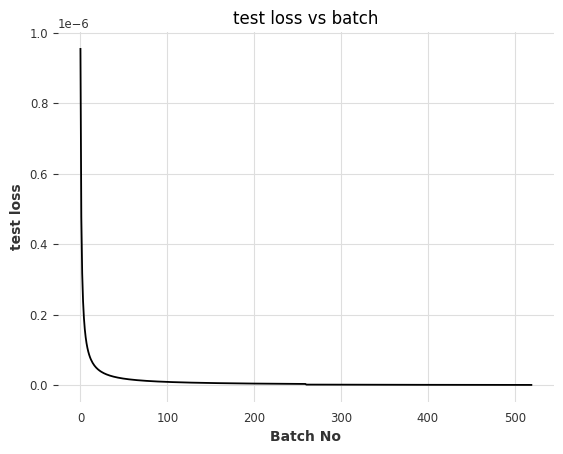

In [82]:
fig, ax = plt.subplots()

ax.plot(new_test_loss)
ax.set_title('test loss vs batch')
ax.set_xlabel('Batch No')
ax.set_ylabel('test loss')

ax.grid(True)

plt.show()

## Analysis
File 2 has 14 signals we are interested in the "flow" and "ribcage" signals only

samples in "flow" and "ribcage" signal **179760** sampling rate **8.0Hz**

no of edf blocks(sec)  **22470.0** is expected  (samples/sampling_rate) 

But No of values in sleep_stages file is **748**

Sleep stages Verify alignment: **22440** (30*748)

### We should probably truncate the last 30 sec

## Basically create a window of 240 values(from the signal), which predicts the sleep stages (1 value from the sleep_stages.txt)

dim = $$ \sum_{\substack{i=1 \\ \text{len}(\text{sleep\_stages}[i]) \text{ exists}}}^{n} \text{len}(\text{sleep\_stages}[i]) $$
X = (dim, 240)

Except the last (<=240values) in the signal of a subject take the 240 values as rows of a tensor